# A Comparison of Early British and American Science Fiction Novels

## Nick Kalinowski

### Text Analytics Final Project

### Introduction

Growing up, science fiction novels were often among my favorite texts to study. That being said, as a relatively "newer" genre of literature, I was particularly interested in reviewing the early histories of these texts and viewing how it progressed in different areas of the world. As the two most popular English-speaking countries for the development of science fiction, Great Britain and the United States produced some of the greatest classical science fiction works in the late 19th and early 20th centuries. As such, I was particularly interested in observing the similarities and difference between the two countries' literature corpora, through Natural Language Processing analytical processes such as Latent Dirichlet Allocation (LDA), Principal Component Analysis (PCA), Syuzhet sentiment analysis, and Word2Vec word embedding studies. I hope to accomplish these tasks by analyzing and comparing six early texts from each country.

The six British texts I will be reviewing, and their publishing years, include:
- *The War of the Worlds*, by HG Wells (1898)
- *The Strange Case of Dr. Jekyll and Mr. Hyde*, by Robert Louis Stevenson (1886)
- *Frankenstein*, by Mary Shelley (1818)
- *The Invisible Man*, by HG Wells (1897)
- *Flatland: A Romance of Many Dimensions*, by Edwin A. Abbott (1884)
- *The Last Man*, by Mary Shelley (1826)

The six American texts I will be reviewing, and their publishing years, include:
- *Looking Backward*, by Edward Bellamy (1888)
- *The Iron Heel*, by Jack London (1907)
- *A Voyage to the Moon*, by George Tucker (1827)
- *The Variable Man*, by Philip K Dick (1953)
- *The Brick Moon*, by Edward Everett Hale (1869)
- *Youth*, by Isaac Asimov (1952)

I hope to answer the questions, "How similar/dissimilar were early works of science fiction in these two nations?", "How different were the sentiments between the two corpora (i.e. were British novels more negative, etc.)?", "What word relationships exist in one corpus that may not exist in the other?", and "Which set of novels had, on average, a larger vocabulary?", among others. Throughout this report, I hope to provide visualizations and datatables to support my analyses, and hopefully conclude with definitive answers to the aforementioned questions by the end of my project.

### About the Corpus

As stated above, the corpus consists of twelve novels, split into two separate corpora: American and British. The original .txt files for these novels were collected from the Project Gutenberg website, [found at this link](https://www.gutenberg.org/). All of these raw text documents can be found on my UVA Box account at [this shareable link](https://virginia.box.com/s/5s72u5x40q01jymsq5xbemmrotnniu4h), as well as the completed Library, Vocab and Corpus files at [this UVA Box URL](https://virginia.box.com/s/pheyxq8t4vms9n1uad2vdrjgq1ornicp).


Some brief exploratory data analysis of both of the corpora revealed several differences in the structures of the two countries' novels. While British novels tend to be longer in length, American novels have a higher mean value of chapters per book, indicating that the latter contains shorter, succint chapters, in comparison to the longer drawn-out style of British books. That being said, nouns were the most common part of speech in both cases, with British novels containing about 25,000 more occurrences of them than their American counterparts (likely due to them being longer in general). A breakdown of how these values were obtained can be found in my code notebook.

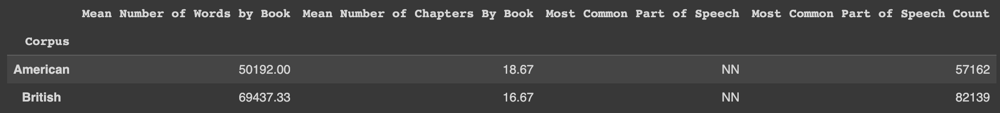

### Data Model


#### Principal Component Analysis (PCA)

For the Principal Component Analysis, I first created two functions called `get_bow` and `calc_tfidf` that created a bag of words and calculated tfidf/dfidf values, respectively. The `get_bow` function takes in the corpus and the desired bag (for this project, I used chapters), and outputs a formal BOW table. From the bag of words, we can calculate the TFIDF by first unstacking the dataframe and individually determining the DF and TF values, by using the inputted IDF equation (for my project I used 'standard'). After the two tables were constructed, I restructured the TFIDF table into the reduced format before passing it to another function I created, which I named `calc_pca`. This function takes in the reduced TFIDF table along with options to normalize the dataset, center by mean, or center by variance. Once completed, I am left with three outputs: a loadings table, a DCM table, and the top `k` comps (also specified by the user). The loadings table can be found at [this UVA Box URL](https://virginia.box.com/s/pheyxq8t4vms9n1uad2vdrjgq1ornicp) in the 'PCA' subfolder. Likewise, in the same function, I created a table mapping each of the ten principle components to most of the words in the vocab table. This "components" table also contains a column depicting the eigenvalues for each of the 10 PCAs. In the below images, the first displays a snippet of the loadings table, and the second depicts the components table.

**Loadings Table Columns**

| Variable Name | Type | Description |
| --- | --- | --- |
| term_str (index) | string | List of Words |
| PC0-PC9 | float | Principal Component Values |

**Components Table Columns**

| Variable Name | Type | Description |
| --- | --- | --- |
| pc_id (index) | string | Principal Component Values |
| eig_val | float | Principal Component Eigenvalue |
| [individual word name] | float | Word Value for Each PC |


**Loadings Table Example**

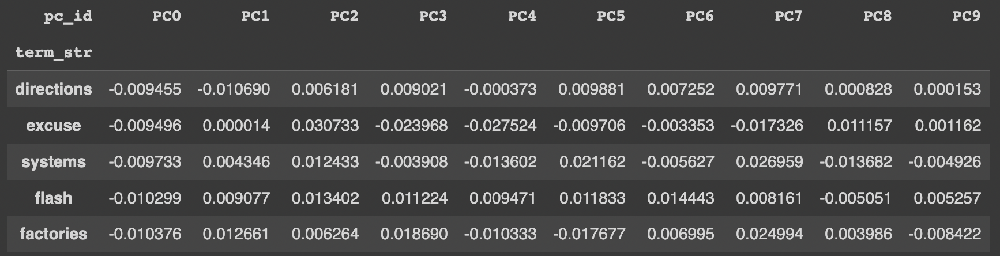

**Components Table Example**

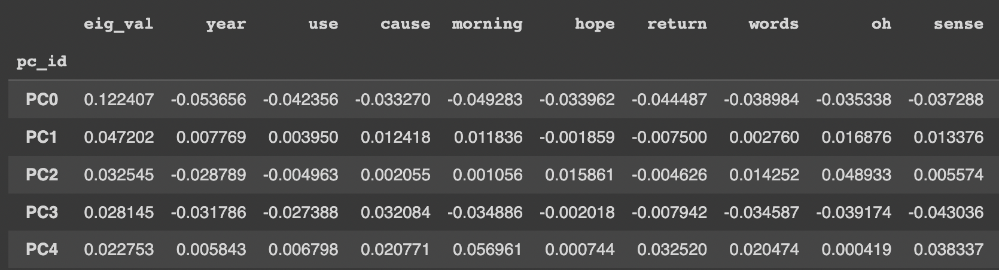

#### Syuzhet Sentiment Analysis

For sentiment analysis, I imported a predetermined table of Syuzhet sentiment values, each assigned to an individual word. Since this table had the same index as the vocab, I could simply merge the two together on their common term strings. After this was completed, I created two separate tables: one for mean sentiment values by book, and one for mean sentiment values by country of origin (American or British). Lastly, I weighted the sentiment values by TFIDF (accomplished by simply multiplying the syu_sentiment column by the tfidf column). The book tables, along with the original sentiment table, can be found at [this UVA Box URL](https://virginia.app.box.com/folder/205688148872?s=pheyxq8t4vms9n1uad2vdrjgq1ornicp) under the "sentiments" subfolder. In the below images, the first table represents a depiction of the word-sentiment relationships, and the second shows the mean weighted sentiment by book.

**Word-Sentiment Table**

| Variable Name | Type | Description |
| --- | --- | --- |
| term_str (index) | string | List of Words |
| n | float | Mean Number of Apperances |
| tfidf_x | float | TFIDF Value |
| dfidf | float | DFIDF Value |
| syu_sentiment | float | Baseline Syuzhet Sentiment Value |
| weighted_sentiment | float | Weighted Sentiment Value |

**Mean Sentiment By Book**

| Variable Name | Type | Description |
| --- | --- | --- |
| book_title | string | Book Title |
| origin | string | Country of Origin |
| weighted_sentiment | float | Weighted Sentiment Value |

**Word-Sentiment Table Example**


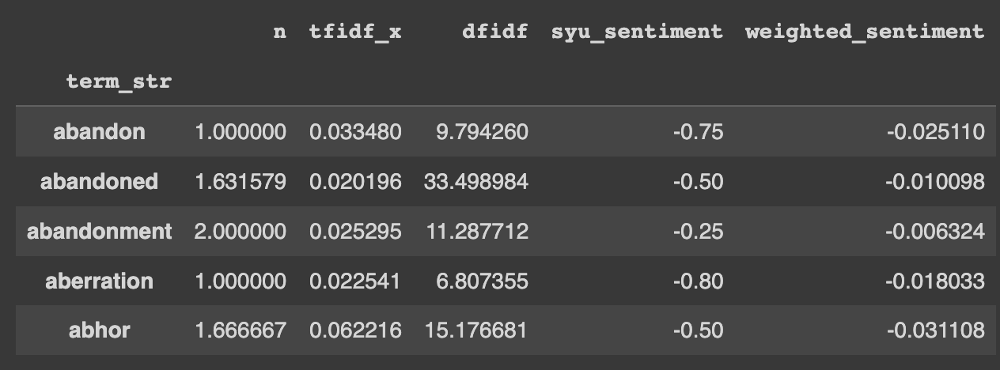

**Mean Sentiment By Book Table Example**

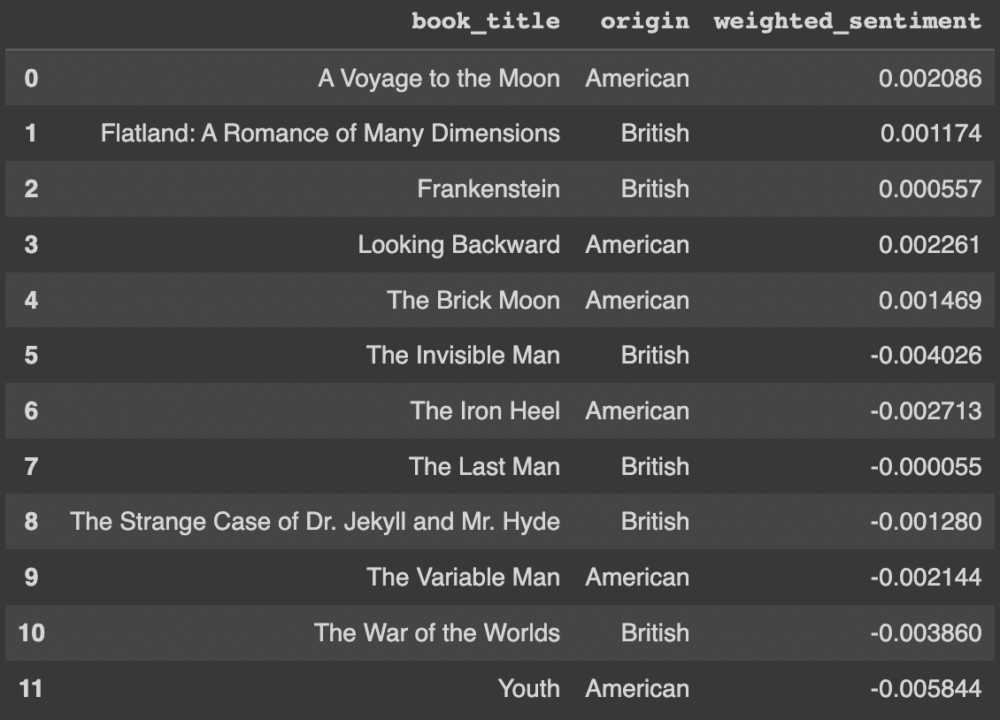


#### Word2Vec Word Embeddings

For the Word Embeddings portion of the project, I created a Word2Vec architecture with the following parameters: vector_size=256, window=2, and min_count=50. The procedure began by creating a DOCS table based off the 'paragraphs' bag - each element in this docs table (actually more like a list), contained a sublist of words, which filled a single paragraph. I also included a stipulation to remove single element docs as well, as these may throw off the final results. Once I verified the DOCS tables were formatted correctly, I passed each of them individually to the Word2Vec algorithm with the aforementioned parameters, resulting in a list of individual word embeddings, that could be passed to a the tSNE library in scikit-learn to be converted to plottable format. These points could be easily displayed using scatter plots in the `plotly` library. The final coordinates table can be seen below.

**Coordinates Table**

| Variable Name | Type | Description |
| --- | --- | --- |
| term_str (index) | string | List of Words |
| n | float | Total Number of Appearances |
| max_pos | string | Part of Speech |
| dfidf | float | DFIDF Value |
| tfidf | float | TFIDF Value |
| doc_count | float | Document Count |
| x | float | x-coordinate |
| y | float | y-coordinate |

**Coordinates Table Example**

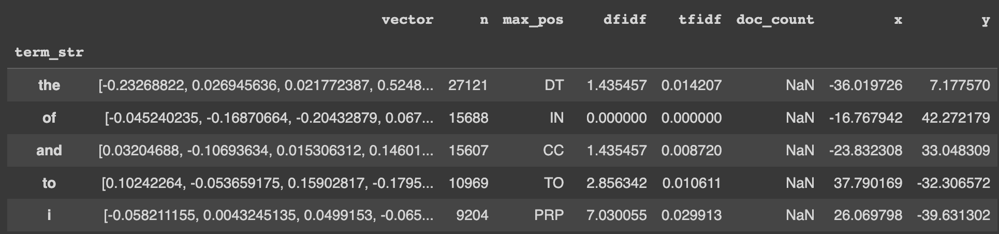

#### Latent Dirichlet Allocation (LDA)


To initialize the LDA, I first had to create a different version of the DOCS table (although still based off the 'paragraphs' bag), that was very similar to the one created in the Word2Vec process, but in DataFrame format. The words in each paragraph went into a column called 'doc_str', and I also included a column called 'term_count' that consisted of the sum of the Document-Term Matrix. At the conclusion of all of my data wrangling, my LDA process resulted in three tables per country of origin: Theta, Phi, and Topics. The 'Theta' tables consist of the distribution of topics over the chosen bag (in this case, paragraphs), whereas the 'Phi' tables shows the distribution of words over topics. The final two tables, 'Topics,' include information about words in each topic, the label, the doc_weight_sum values for each corpus, and the topic frequencies. The Doc Weight Sum assigns a value to a word based off its frequency in the desired corpus. The final Theta, Phi, and Topic tables for the British corpus can be seen below:

**Theta Table**

| Variable Name | Type | Description |
| --- | --- | --- |
| book_id, chap_id, para_num (index) | int | OHCO Index |
| T00-T09 | float | Topic Values for Each Paragraph |

**Phi Table**

| Variable Name | Type | Description |
| --- | --- | --- |
| topic_id (index) | string | List of Topics |
| [individual word] | float | Word Values for Each Topic |

**Topics Table**

| Variable Name | Type | Description |
| --- | --- | --- |
| topic_id (index) | string | List of Topics |
| 0-8 | string | Most Associated Words for Each Topic |
| label | string | Label for Graphs |
| doc_weight_sum_brit | float | Document Weight for British Novels |
| doc_weight_sum_amer | float | Document Weight for American Novels |
| term_freq | float | Term Frequency |

**Theta Table Example**

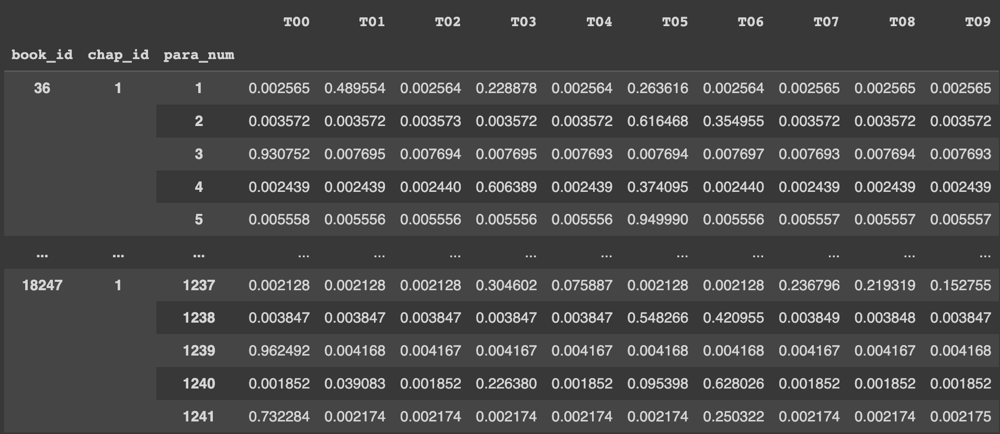

**Phi Table Example**

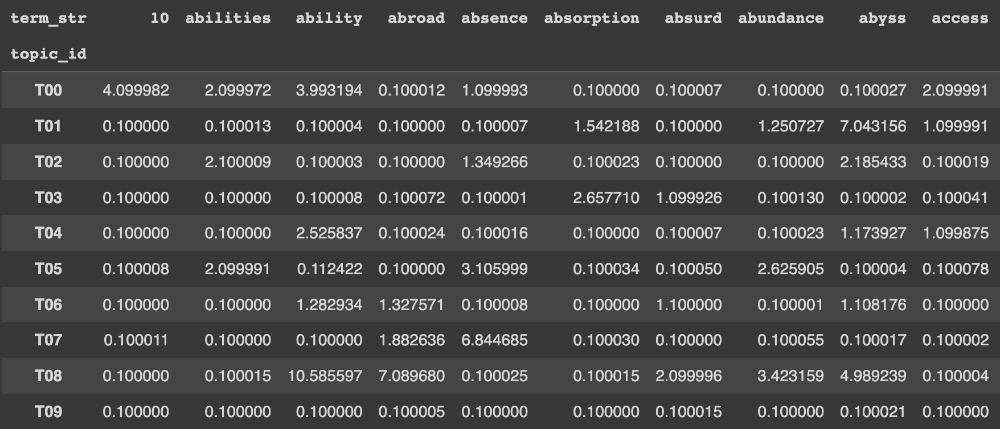

**Topics Table Example**

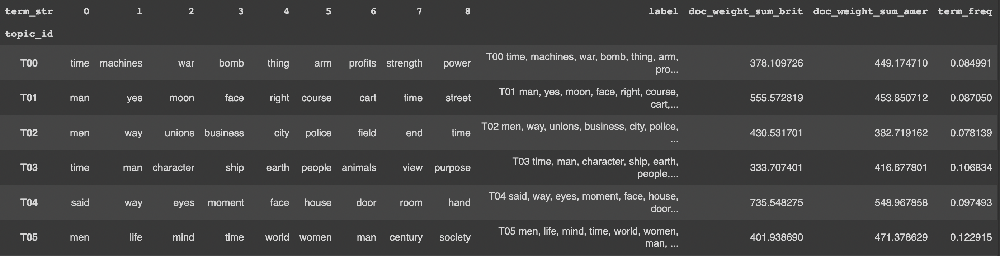

### Exploration

#### Principal Component Analysis (PCA)

For PCA, the OHCO bag I chose to use for my analysis was chapters. I hoped to explore whether British and American early science fiction novels were similar on a general level, and since PCAs tend to converge closer to zero as they increase, I mainly focused my observations on the first principal compenent, PC0. For my first visualization, I hoped to observe if there was a fundamental difference in this first principal component between the two corpora (which, as it turns out, there was!). After this initial analysis, I broke the corpora down further to study the individual books within them, and see whether or not any one of them was affecting the final result by being a major outlier. I thought that a box (or dispersion) plot would be helpful to answer both of these questions. Finally, I hoped to confirm my initial thought that PC0 would serve as the best point of analysis among all of the principal components, so I plotted the mean values for each of the 10 PC's on a grouped bar chart to depict their convergence to zero.

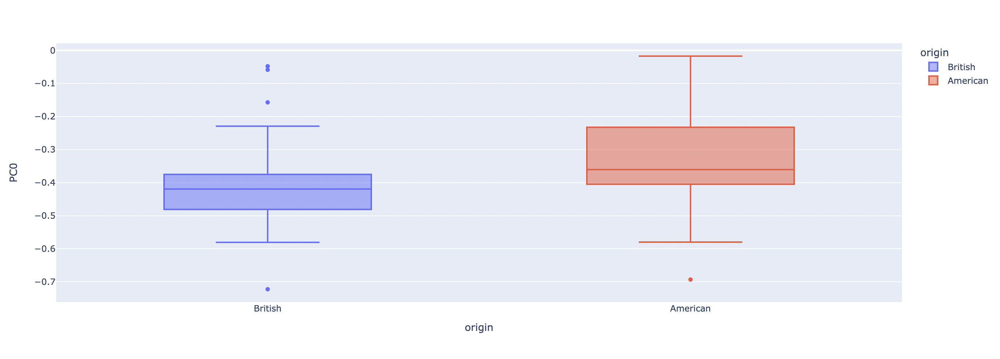

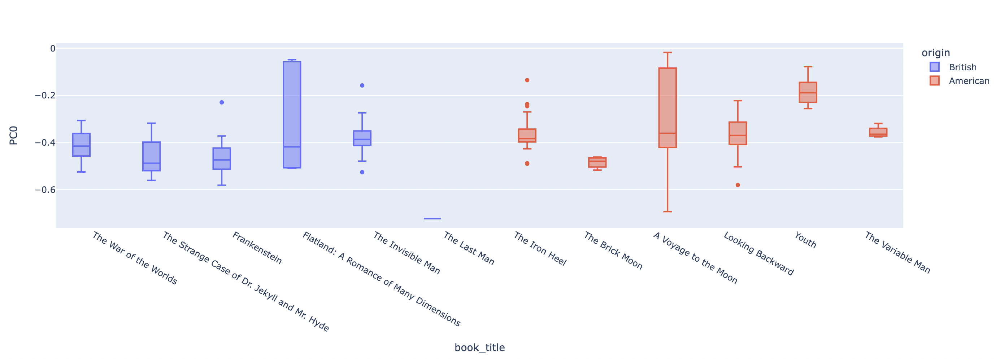

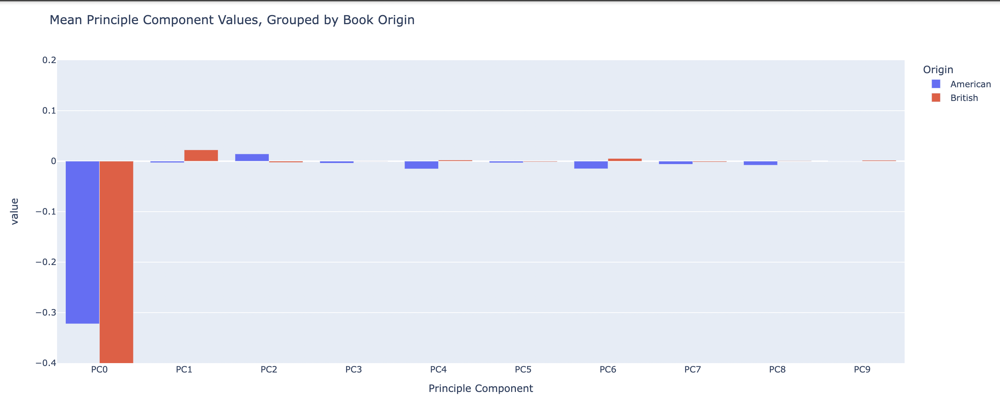


#### Syuzhet Sentiment Analysis

To create my sentiment analysis visualizations, I created two separate dataframes: the aforementioned book dataframe and a similarly formatted table with the mean weighted_sentiment values grouped by origin. Each of the first two bar charts follow the same procedure, where I plot the mean sentiment values on the y-axis, and the groupings (country of origin or book title) on the x-axis. Likewise, much like PCA, I was interested in how the distribution of books affected the final sentiment results. Similarly to my previous analyses, I felt like a dispersion plot worked best for this portion of the report. Since my chosen sentiment metric, Syuzhet, did not contain any emotional component, I was unable to study the emotions of each text for this project, but that could be an interesting topic to explore for future work. 

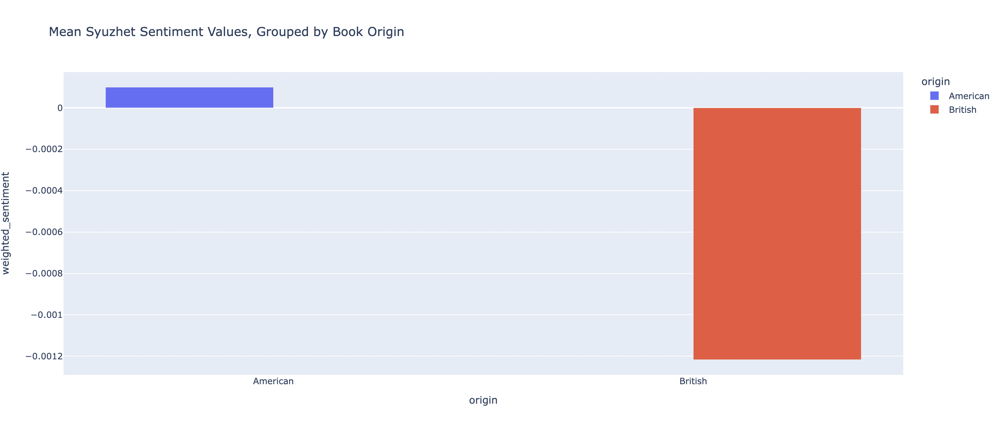

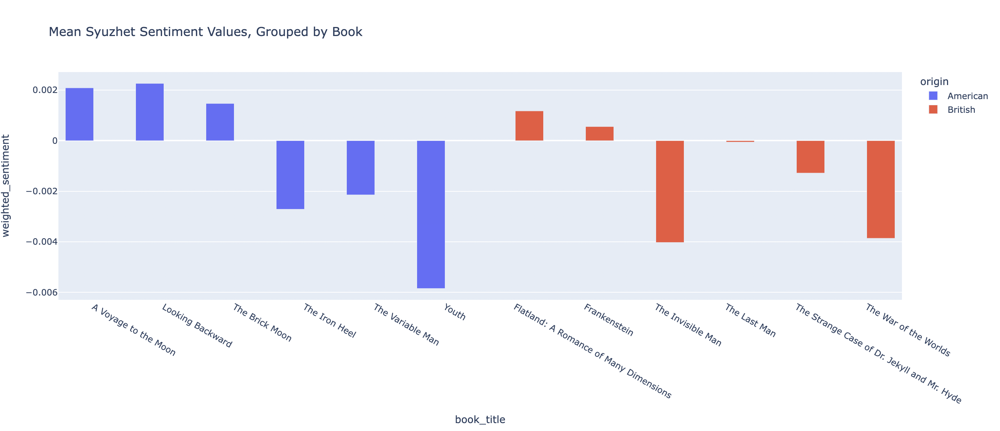

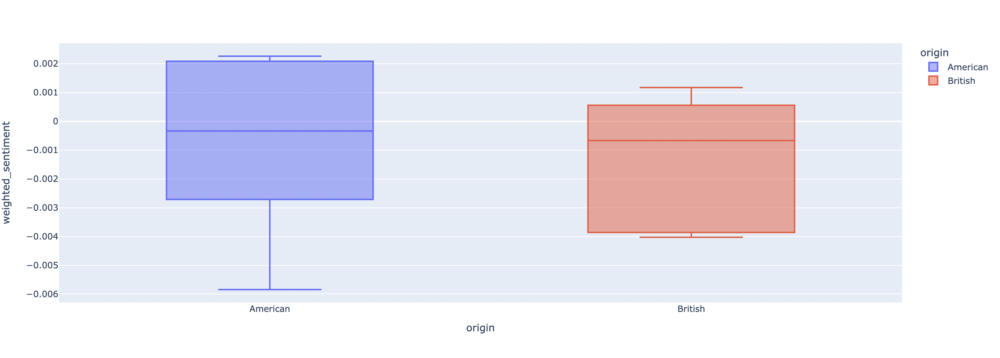


#### Word2Vec Word Embeddings

Since most of the work for creating the coordinates tables for the word embeddings was performed by the tSNE engine, it became quite simple to output these graphs using `plotly` and the 'x'/'y' columns of the coords tables. These scatter plots were also colored by part of speech, to provide a deeper understanding of the interactions between words of different families. Both of the scatter plots can be seen below.

**British Corpus Word Embeddings Plot**

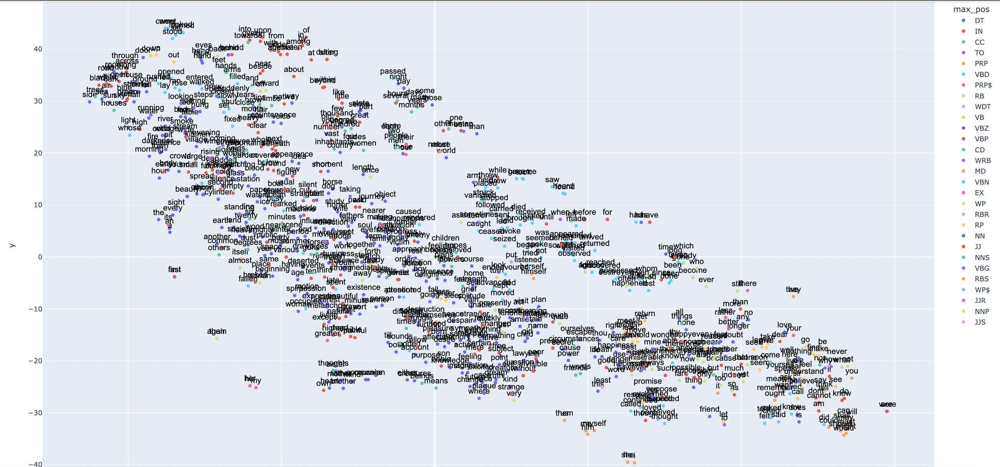

**American Corpus Word Embeddings Plot**

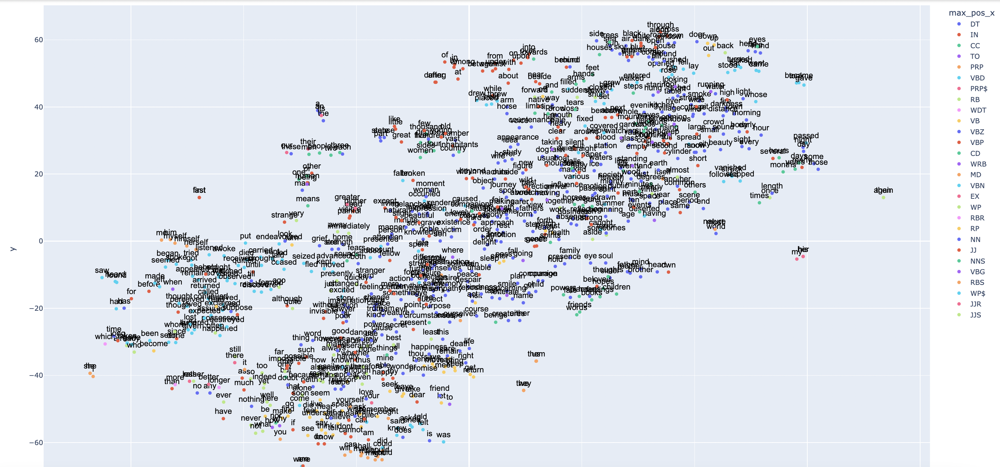

### Latent Dirichlet Allocation (LDA)

I decided to create two distinct types of visualizations for the Latent Dirichlet Allocation. Firstly, I created two separate heatmaps (one for each corpus) to illustrate the difference in topic importance between paragraphs in the corpus. I accomplished this by taking a random sample of 20 paragraphs from the Theta tables, and coloring them based off topic significance - cells that appear darker and closer to blue/purple indicate a higher significance level, whereas yellow cells are generally unimportant. Additionally, I was interested in observing the differences in document weighting between the two corpora, especially in relation to the term frequency of the topics in the whole dataset. As such, I plotted two scatter diagrams (again, one for each corpus) to examine the differences in doc weight, with the term_freq column on the y-axis.  

**British Corpus Topic Heatmap**

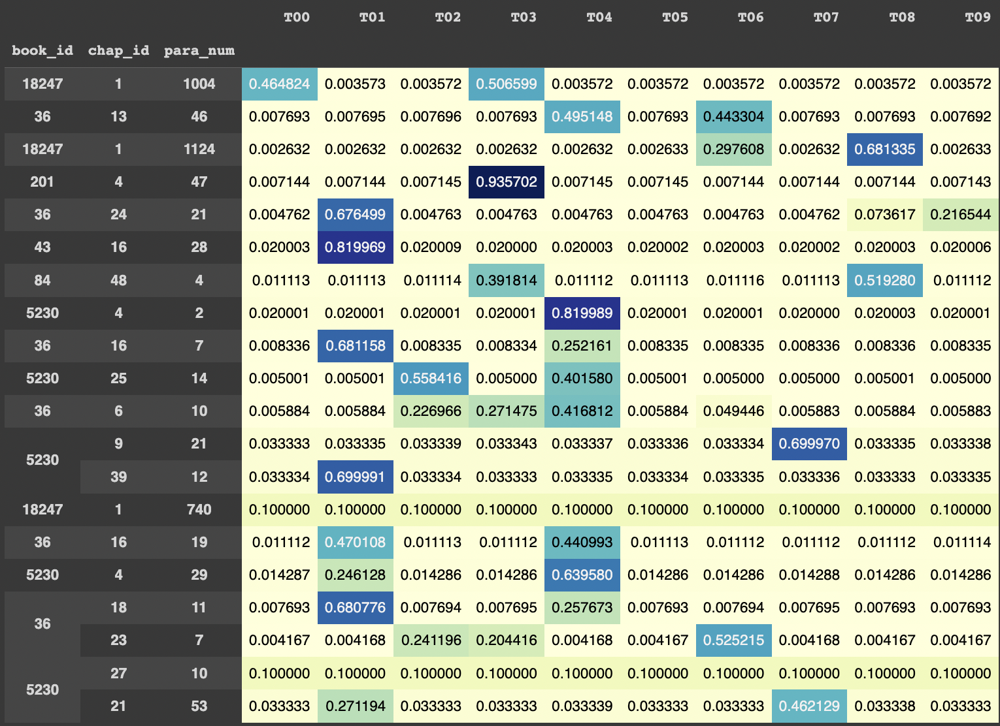

**American Corpus Topic Heatmap**

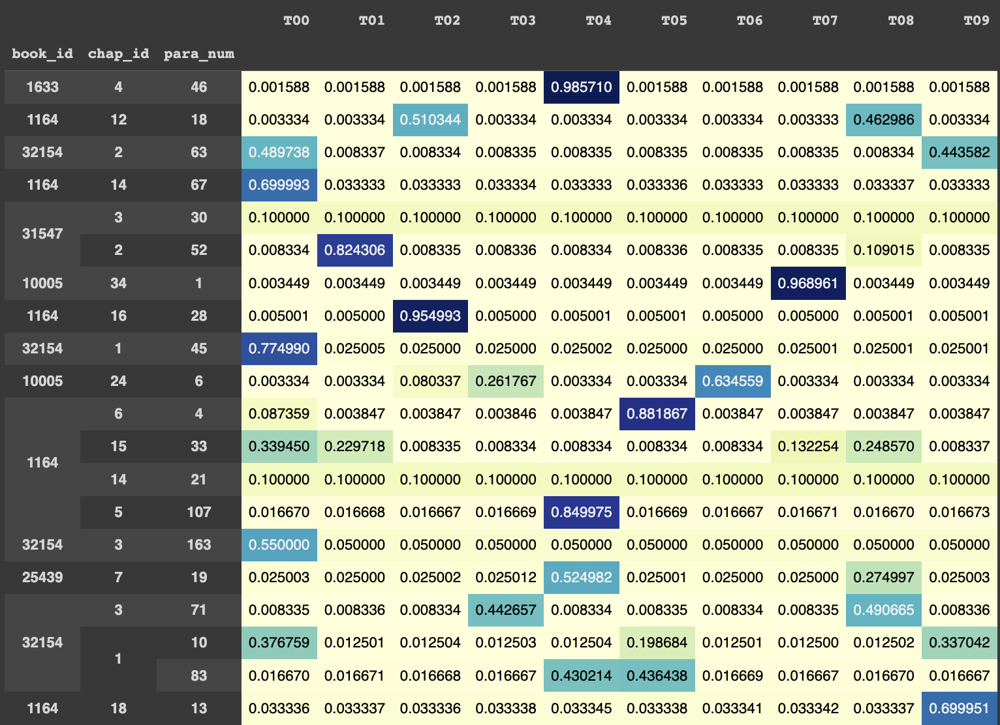

**British Corpus Doc Weight Scatter Diagram**

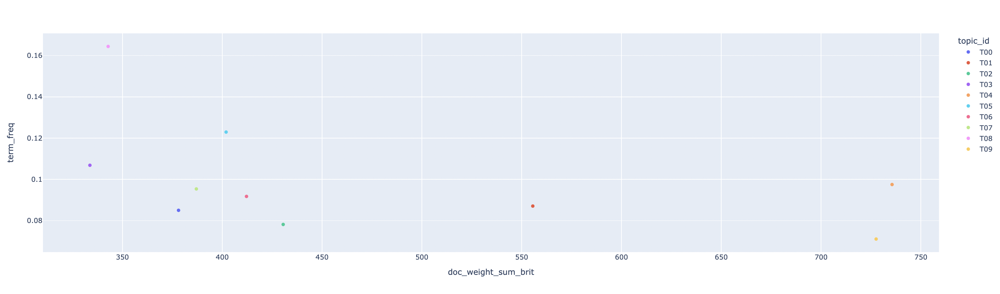

**American Corpus Doc Weight Scatter Diagram**

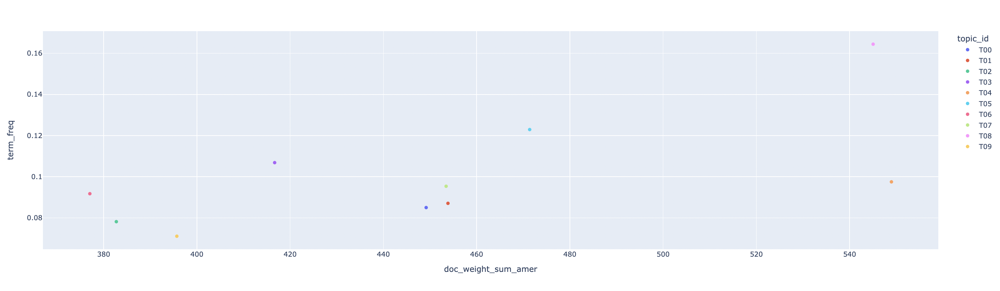

### Interpretations

For Principal Component Analysis, I noticed a significant difference in the first Principal Component between the American and British science fiction corpora. As observed from the first dispersion plot, the American corpora had a mean PC0 of -0.35, whereas the British corpora possessed a value of -0.42. That being said, further investigation into the book level revealed that one text in particular, *The Last Man* by Mary Shelley, seemed to drag down the overall PC0 level of the British corpus. As this novel only contained one "chapter", its vastly negative value likely impacted the overall mean value of the corpurs. Finally, the bar chart indicated (as expected) that PC0 was the optimal Principal Component to study for this analysis, as the points quickly converged from the second PC onwards. 

Likewise, the Syuzhet polarity depicted a *very* slight overall positive sentiment in the American corpus, as compared to an overall negative sentiment in the British texts. This result reflected my initial hypothesis; however, it was interesting to note that the most negative text in the entire library, *Youth* by Isaac Asimov, was actually an American novel. In reality, the difference between the two collections of books goes down to the third decimal place, so there really isn't too significant of a difference in the polarity, which can be further shown through the dispersion plot, where the means are very close to equal.

To test the efficacy of Word2Vec, I created two functions: `get_most_similar` and `complete_analogy`, which perform two separate calls to the Word2Vec engine. `get_most_similar` takes the input of a word in the corpus, and outputs the other words that the Word2Vec deems to be most associated with that term. Furthermore, `complete_analogy` takes three words, and produces a fourth word that Word2Vec thinks should finish the analogy. For example, `complete_analogy('human', 'being', animal')` is the equivalent of the analogy human : being :: animal : X, where X is the output of the function. The results of the function calls are below:

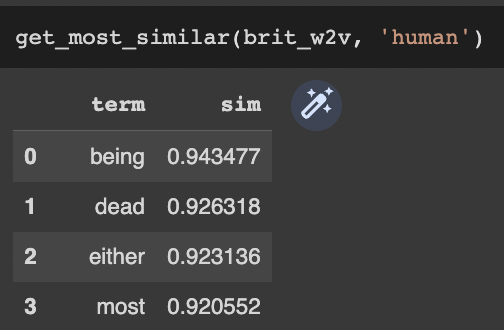

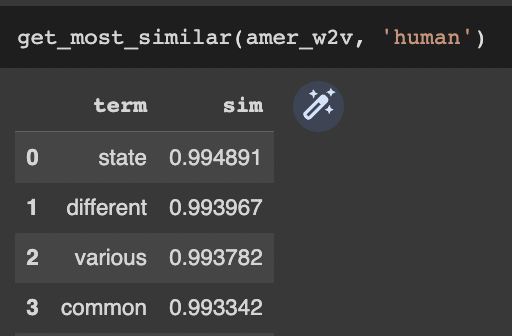

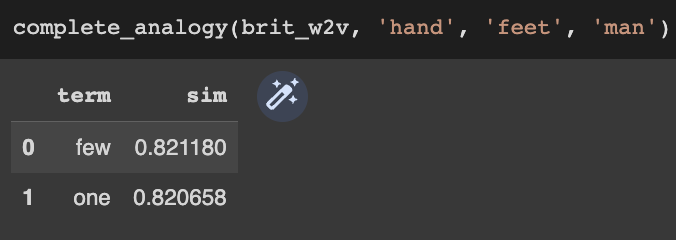

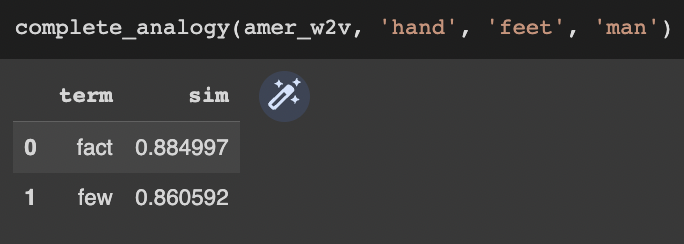

We can observe several similarities and differences between the two corpora in these results. While the `get_most_similar` results differed greatly (it seemed to work better for the British corpus, as the American results do not seem to contain words that are commonly associated with 'human'), running hte same `complete_analogy` call on both libraries revealed the word 'few' in both cases, indicating that the vocabulary relationships between American and British novels may be quite similar.

Finally, the heatmaps in my Latent Dirichlet Allocation analysis show disparate results among a random sample of paragraphs for the ten topics that the model outputted. More significantly, the scatter plots show that some of these topics were more important in one library as opposed to the other. In the British corpus, the three topics with the highest doc_weight_sum values were T04, T09, (followed by a large gap) and T01. By contrast, the model determined that the highest doc_weight_sum topics in the American libary were T04, T08, (followed by another large gap) and T05. Another interesting aspect of the data is that Topic 4 appears to be the most heavily weighted topic in both corpora, despite being only the fourth most frequent topic in the overall library.

Overall, this analysis showed that British and American early science fiction novels not only slighty differed in several aspects of Natural Language Processing analysis, such as sentiment and topic modeling, but were also quite similar in others, such as word embeddings. These results may indicate that British and American writers did possess distinct styles in some respects, but may have also taken inspiration from one another in their texts. 